In [15]:
import re 
import json
import nltk 
import string 
import multiprocessing
import numpy as np
import pandas as pd
from nltk.stem.porter import *
from collections import Counter
import matplotlib.pyplot as plt
from tqdm import tqdm_notebook
from nltk.corpus import stopwords 
from nltk.stem import WordNetLemmatizer 
lemmatizer = WordNetLemmatizer() 
from nltk.tokenize import word_tokenize
from wordcloud import WordCloud, STOPWORDS
np.random.seed(2018)
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_colwidth', -1)
pd.set_option('display.float_format', lambda x: '%.3f' % x)
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)
plt.style.use('classic')
%matplotlib inline
s=12

__author__ = 'HK Dambanemuya'
__version__ = 'Python2'

In [2]:
df = pd.read_csv("../../Data/Fusion/blogs.csv")

In [3]:
stop_words = stopwords.words("english")
stop_words.extend(['coronavirus', 'covid', 'virus', 'news', 'new', 'outbreak', 'pandemic', 'google', 'alert'])

In [4]:
# convert to lowercase
def text_lowercase(text): 
    return text.decode('ascii', 'ignore').lower() 

# remove numbers
def remove_numbers(text): 
    result = re.sub(r'\d+', '', text.encode('ascii', 'ignore')) 
    return result 

# remove whitespace from text 
def remove_whitespace(text): 
    return  " ".join(text.encode('ascii', 'ignore').split())

# remove stopwords 
def remove_stopwords(text): 
    word_tokens = word_tokenize(text.encode('ascii', 'ignore')) 
    filtered_text = [word for word in word_tokens if word not in stop_words] 
    return filtered_text 

# pre-process text
def pre_process(text):
    text_lower = text_lowercase(str(text).decode('ascii', 'ignore'))
    no_numbers = remove_numbers(text_lower)
    no_punctuation = no_numbers.translate(None, string.punctuation)
    no_whitespace = remove_whitespace(no_punctuation)
    no_stopwords = remove_stopwords(no_whitespace)
    lemmas = [lemmatizer.lemmatize(token) for token in no_stopwords]
    no_chars = [i for i in lemmas if len(i) > 1]
    return no_chars   

# get bi-grams
def bi_grams(tokens):
    return list(nltk.bigrams(tokens))

In [5]:
pool = multiprocessing.Pool(processes=8)

In [6]:
titles = pool.map(pre_process, df['title'].dropna())

In [7]:
words = [element for lis in titles for element in lis]

In [8]:
print Counter(words).most_common(100) 

[('china', 34920), (u'case', 34840), ('trump', 24159), (u'say', 24090), (u'update', 22879), ('march', 22166), ('health', 21633), ('amid', 21515), ('home', 20824), ('day', 20047), ('due', 20033), ('time', 19598), (u'test', 18407), ('market', 16187), ('death', 15563), (u'state', 15558), ('first', 15365), ('world', 15358), ('positive', 15102), (u'spread', 14937), ('crisis', 14894), ('corona', 14557), ('fear', 14239), ('people', 14211), (u'report', 13830), ('business', 13219), ('help', 12870), ('stock', 12760), ('week', 12196), ('response', 12004), ('quarantine', 11872), ('school', 11433), ('get', 11186), ('lockdown', 11117), (u'close', 11047), ('could', 10881), ('emergency', 10670), ('travel', 10472), ('wuhan', 10455), ('need', 10406), ('global', 10232), ('city', 9859), ('chinese', 9723), ('free', 9687), (u'show', 9525), ('latest', 9497), ('top', 9406), ('government', 9371), ('social', 9331), ('one', 9282), (u'plan', 9186), ('take', 9122), ('fight', 9084), ('call', 9058), ('go', 8764), ('

In [9]:
grams_collection = pool.map(bi_grams, titles)

In [10]:
topics = []
for grams in tqdm_notebook(grams_collection):
    topics.extend(grams)

In [11]:
len(titles), len(topics)

(967062, 4986242)

### Save Discussion Topics to File

In [12]:
top_1k = Counter(topics).most_common(1000)

In [13]:
# b1k = [i[0] for i in top_1k]

In [19]:
with open('../../Reloaded/Data/topics_b.csv', 'w') as f:
    f.write(json.dumps(top_1k))

### Visualize Topics

In [17]:
wordcloud = WordCloud(stopwords=stop_words, max_font_size=24, max_words=100, background_color="white").generate(string.join(words))

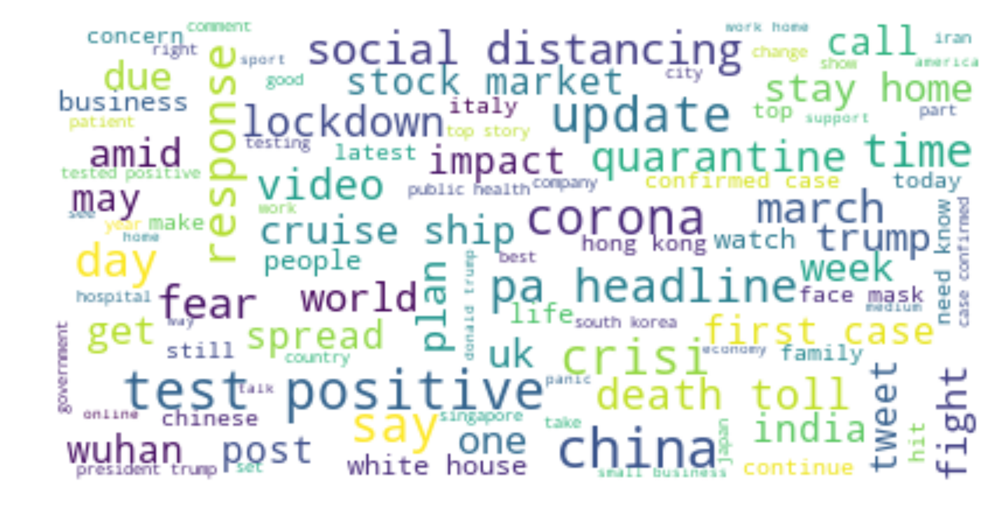

In [18]:
plt.figure(figsize=(8, 5), dpi=1080)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout()
plt.show()